# SSL Pretraining results 
Update: 4 Jul 2023
- Section for single and multi SSL

In [1]:
import pickle
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rc
rc('mathtext', default='regular')

## 1. Single-tasking SSL
### 1.1. Reconstructed Image for Image Inpainting

In [2]:
base_path = './Results/SingleSSL/'

In [3]:
with open(base_path+"img_augImg_RecIm_list.pkl", "rb") as file:
    obj = pickle.load(file)

In [4]:
obj = obj[0]

In [5]:
oriImgs = obj[0]
augImgs = obj[1]
reconImgs = obj[2]

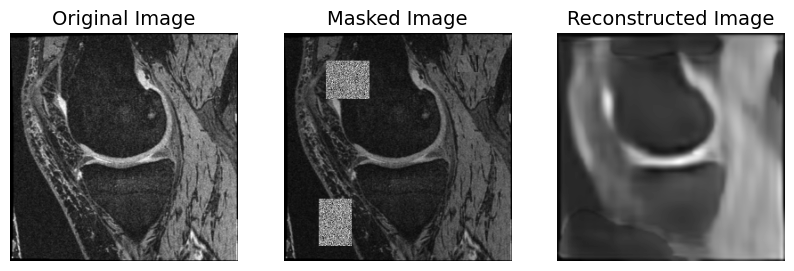

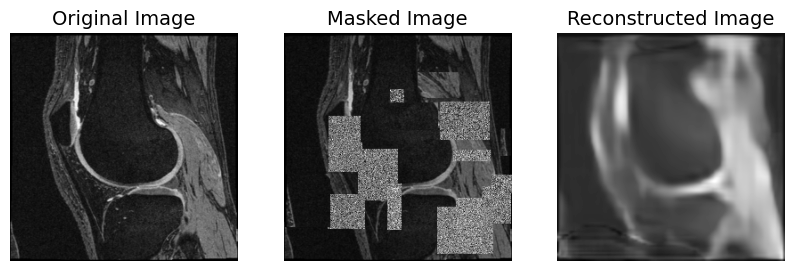

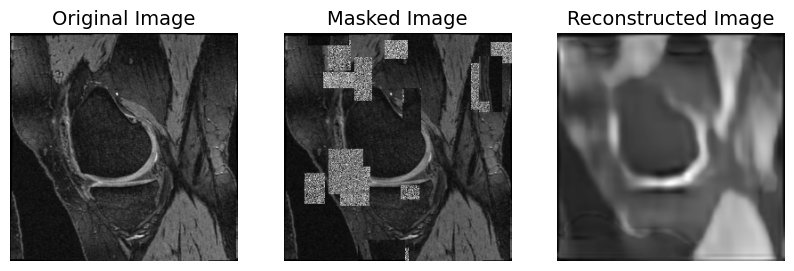

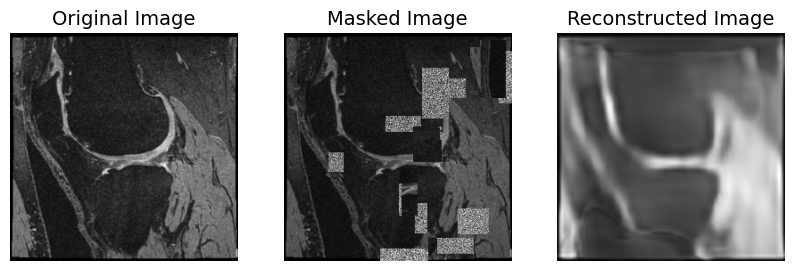

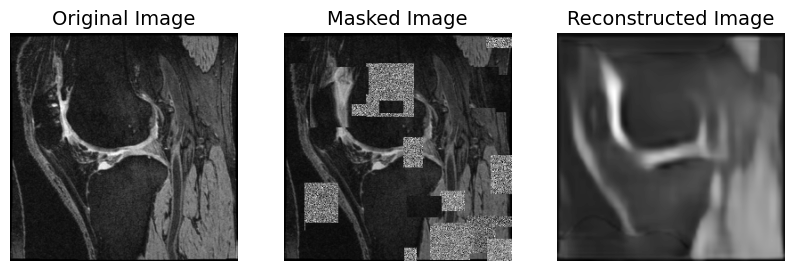

...

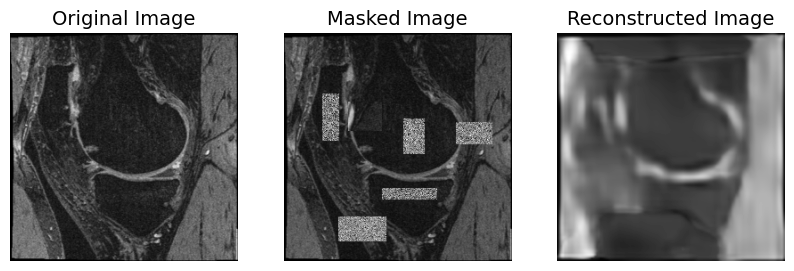

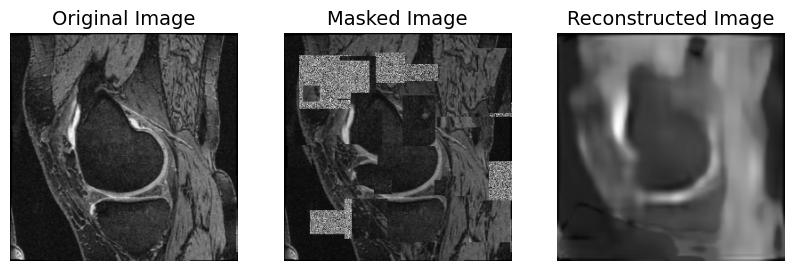

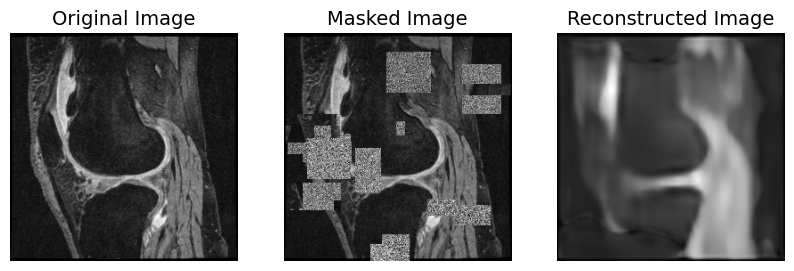

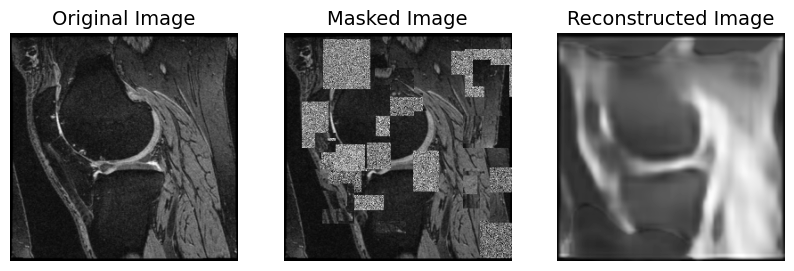

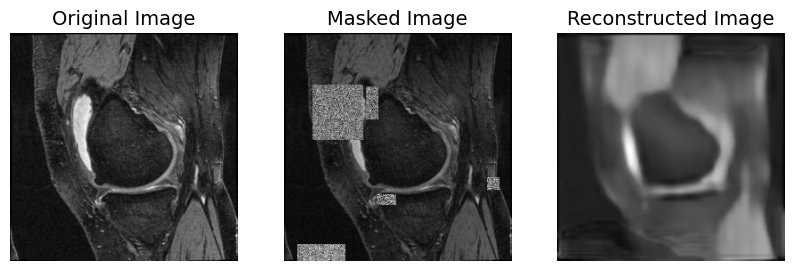

In [6]:
for idx in range(len(oriImgs)):
    neworiImgs = oriImgs[idx].reshape((256, 256, 1)).astype('float32')
    newaugImgs = augImgs[idx].reshape((256, 256, 1)).astype('float32')
    newreconImgs = reconImgs[idx].reshape((256, 256, 1)).astype('float32')

    fig, ax = plt.subplots(1, 3, figsize=(10, 10))
    
    ax[0].imshow(neworiImgs[:, :, 0], cmap='gray')
    ax[0].axis('off')
    ax[0].set_title('Original Image', fontsize=14)
    ax[1].imshow(newaugImgs[:, :, 0], cmap='gray')
    ax[1].axis('off')
    ax[1].set_title('Masked Image', fontsize=14)
    ax[2].imshow(newreconImgs[:, :, 0], cmap='gray')
    ax[2].axis('off')
    ax[2].set_title('Reconstructed Image', fontsize=14)
    
    plt.show()

### 1.2. Plot training and validation loss curves

Text(0.5, 1.0, 'Training and Validation Losses in Single-tasking SSL')

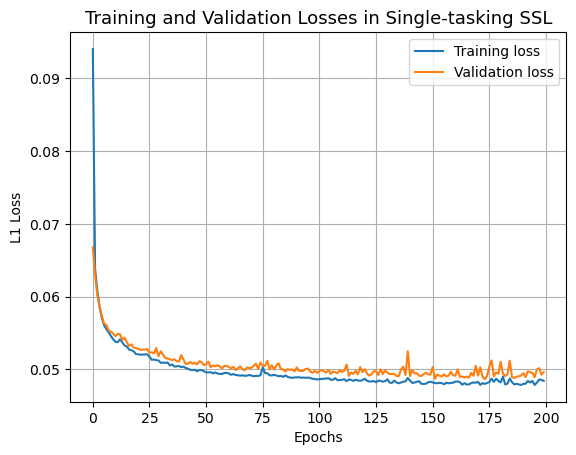

In [7]:
filepath = 'losses_train.pkl'
with open(base_path+'losses_train.pkl', "rb") as file:
    train = pickle.load(file)

with open(base_path+'losses_val.pkl', "rb") as file:
    val = pickle.load(file)

plt.plot(train, label='Training loss')
plt.plot(val, label='Validation loss')
plt.xlabel('Epochs')
plt.ylabel('L1 Loss')
# plt.ylim(0.0, 3.5)
plt.legend(loc='upper right')
plt.grid(True)  # Add gridlines
plt.title('Training and Validation Losses in Single-tasking SSL', fontsize=13)

## 2. Multi-tasking SSL
### 2.1. Reconstructed Image for Image Inpainting

In [8]:
base_path = './Results/MultiSSL/'

In [9]:
with open(base_path+"img_augImg_RecIm_list.pkl", "rb") as file:
    obj = pickle.load(file)

In [10]:
obj = obj[0]

In [11]:
oriImgs = obj[0]
rotImgs = obj[1]
augImgs = obj[2]
reconImgs = obj[3]

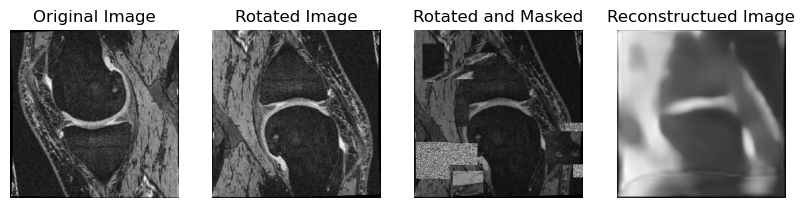

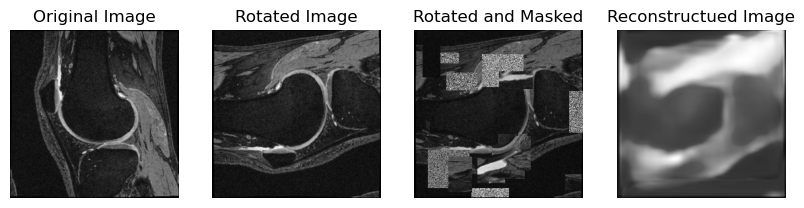

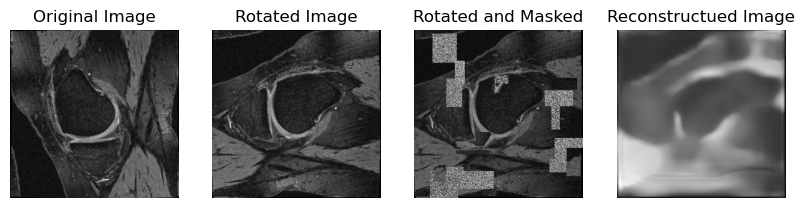

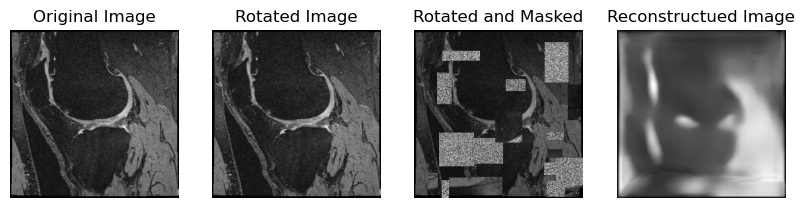

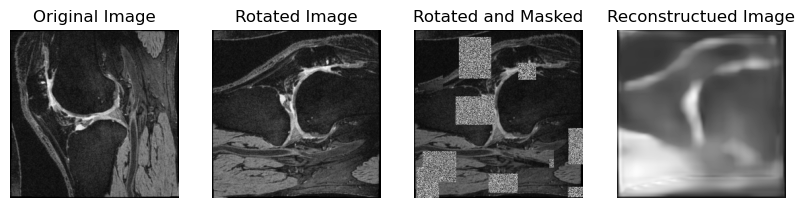

...

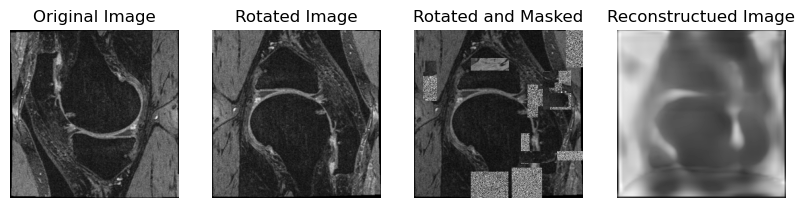

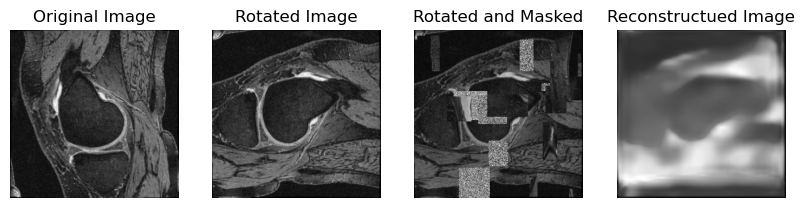

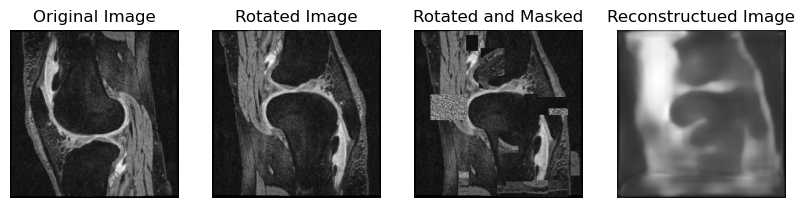

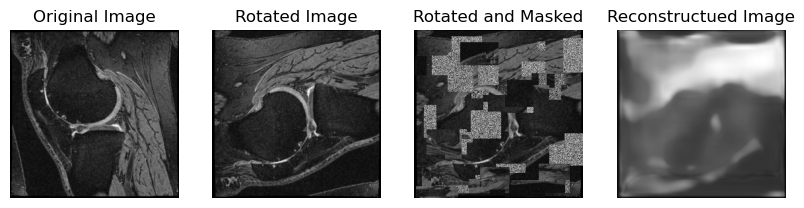

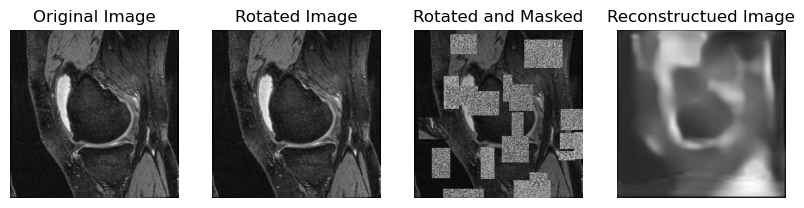

In [12]:
# range 0 - 31
for idx in range(len(oriImgs)):
    neworiImgs = oriImgs[idx].reshape((256, 256, 1)).astype('float32')
    newrotImgs = rotImgs[idx].reshape((256, 256, 1)).astype('float32')
    newaugImgs = augImgs[idx].reshape((256, 256, 1)).astype('float32')
    newreconImgs = reconImgs[idx].reshape((256, 256, 1)).astype('float32')

    fig, ax = plt.subplots(1, 4, figsize=(10, 10))
    ax[0].imshow(neworiImgs[:, :, 0], cmap='gray')
    ax[0].axis('off')
    ax[0].set_title('Original Image', fontsize=12)
    ax[1].imshow(newrotImgs[:, :, 0], cmap='gray')
    ax[1].axis('off')
    ax[1].set_title('Rotated Image', fontsize=12)
    ax[2].imshow(newaugImgs[:, :, 0], cmap='gray')
    ax[2].axis('off')
    ax[2].set_title('Rotated and Masked', fontsize=12)
    ax[3].imshow(newreconImgs[:, :, 0], cmap='gray')
    ax[3].axis('off')
    ax[3].set_title('Reconstructued Image', fontsize=12)
        
    plt.show()


### 2.2. Plot training and validation loss curves

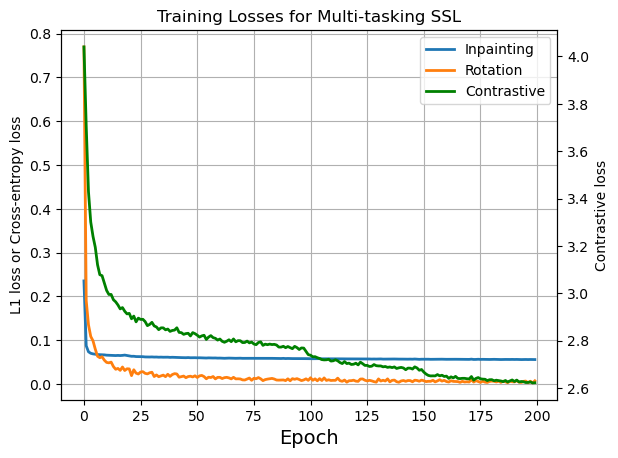

In [13]:
with open(base_path+'losses_train_tuple.pkl', "rb") as file:
    obj = pickle.load(file)

rotLoss = obj[0]
conLoss = obj[1]
recLoss = obj[2]

fig = plt.figure()
ax = fig.add_subplot(111)

lns1 = ax.plot(recLoss, '-', label = 'Inpainting', linewidth=2)
lns2 = ax.plot(rotLoss, '-', label = 'Rotation', linewidth=2)
ax2 = ax.twinx()
lns3 = ax2.plot(conLoss, '-g', label = 'Contrastive', linewidth=2)

ax.tick_params(axis='both')
ax2.tick_params(axis='both')

# added these three lines
lns = lns1+lns2+lns3
labs = [l.get_label() for l in lns]
ax.legend(lns, labs, loc=0)

ax.grid()
ax.set_xlabel("Epoch", fontsize=14)
ax.set_ylabel('L1 loss or Cross-entropy loss')
ax2.set_ylabel('Contrastive loss')
# ax2.set_ylim(0, 35)
# ax.set_ylim(-20,100)
ax.set_title('Training Losses for Multi-tasking SSL')
plt.show()

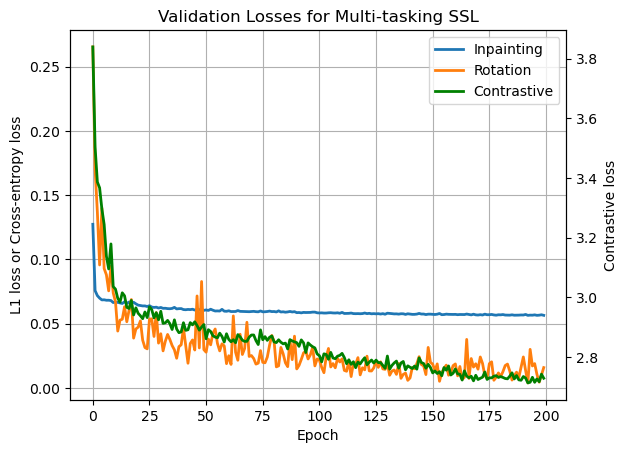

In [14]:
with open(base_path+'losses_val_tuple.pkl', "rb") as file:
    obj = pickle.load(file)

rotLoss = obj[0]
conLoss = obj[1]
recLoss = obj[2]

fig = plt.figure()
ax = fig.add_subplot(111)

lns1 = ax.plot(recLoss, '-', label = 'Inpainting', linewidth=2)
lns2 = ax.plot(rotLoss, '-', label = 'Rotation', linewidth=2)
ax2 = ax.twinx()
lns3 = ax2.plot(conLoss, '-g', label = 'Contrastive', linewidth=2)

ax.tick_params(axis='both')
ax2.tick_params(axis='both')

# added these three lines
lns = lns1+lns2+lns3
labs = [l.get_label() for l in lns]
ax.legend(lns, labs, loc=0)

ax.grid()
ax.set_xlabel("Epoch")
ax.set_ylabel('L1 loss or Cross-entropy loss')
ax2.set_ylabel('Contrastive loss')
ax.set_title('Validation Losses for Multi-tasking SSL')
plt.show()